<a href="https://colab.research.google.com/github/microsoft/qlib/blob/main/examples/workflow_by_code.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#  Copyright (c) Microsoft Corporation.
#  Licensed under the MIT License.

In [ ]:
import sys, site
from pathlib import Path

################################# NOTE #################################
#  Please be aware that if colab installs the latest numpy and pyqlib  #
#  in this cell, users should RESTART the runtime in order to run the  #
#  following cells successfully.                                       #
########################################################################

try:
    import qlib
except ImportError:
    # install qlib
    ! pip install --upgrade numpy
    ! pip install pyqlib
    # reload
    site.main()

scripts_dir = Path.cwd().parent.joinpath("scripts")
if not scripts_dir.joinpath("get_data.py").exists():
    # download get_data.py script
    scripts_dir = Path("~/tmp/qlib_code/scripts").expanduser().resolve()
    scripts_dir.mkdir(parents=True, exist_ok=True)
    import requests
    with requests.get("https://raw.githubusercontent.com/microsoft/qlib/main/scripts/get_data.py") as resp:
        with open(scripts_dir.joinpath("get_data.py"), "wb") as fp:
            fp.write(resp.content)

In [1]:
import sys
import qlib
import pandas as pd
from qlib.constant import REG_CN
from qlib.utils import exists_qlib_data, init_instance_by_config
from qlib.workflow import R
from qlib.workflow.record_temp import SignalRecord, PortAnaRecord
from qlib.utils import flatten_dict


In [2]:
# use default data
# NOTE: need to download data from remote: python scripts/get_data.py qlib_data_cn --target_dir ~/.qlib/qlib_data/cn_data
provider_uri = r"D:\Documents\TradeResearch\qlib_test\rqdata"  # target_dir
if not exists_qlib_data(provider_uri):
    print(f"Qlib data is not found in {provider_uri}")
    sys.path.append(str(scripts_dir))
    from get_data import GetData
    GetData().qlib_data(target_dir=provider_uri, region=REG_CN)
qlib.init(provider_uri=provider_uri, region=REG_CN)

[28648:MainThread](2022-04-14 08:54:34,320) INFO - qlib.Initialization - [config.py:402] - default_conf: client.
[28648:MainThread](2022-04-14 08:54:34,337) INFO - qlib.Initialization - [__init__.py:73] - qlib successfully initialized based on client settings.
[28648:MainThread](2022-04-14 08:54:34,338) INFO - qlib.Initialization - [__init__.py:75] - data_path={'__DEFAULT_FREQ': WindowsPath('D:/Documents/TradeResearch/qlib_test/rqdata')}


In [3]:
market = "csi300"
benchmark = "SH000300"

# train model

In [4]:
###################################
# train model
###################################
data_handler_config = {
    "start_time": "2008-01-01",
    "end_time": "2020-08-01",
    "fit_start_time": "2008-01-01",
    "fit_end_time": "2014-12-31",
    "instruments": market,
}

task = {
    "model": {
        "class": "LGBModel",
        "module_path": "qlib.contrib.model.gbdt",
        "kwargs": {
            "loss": "mse",
            "colsample_bytree": 0.8879,
            "learning_rate": 0.0421,
            "subsample": 0.8789,
            "lambda_l1": 205.6999,
            "lambda_l2": 580.9768,
            "max_depth": 8,
            "num_leaves": 210,
            "num_threads": 20,
        },
    },
    "dataset": {
        "class": "DatasetH",
        "module_path": "qlib.data.dataset",
        "kwargs": {
            "handler": {
                "class": "Alpha158",
                "module_path": "qlib.contrib.data.handler",
                "kwargs": data_handler_config,
            },
            "segments": {
                "train": ("2008-01-01", "2014-12-31"),
                "valid": ("2015-01-01", "2016-12-31"),
                "test": ("2017-01-01", "2020-08-01"),
            },
        },
    },
}

# model initiaiton
model = init_instance_by_config(task["model"])
dataset = init_instance_by_config(task["dataset"])

# start exp to train model
with R.start(experiment_name="train_model"):
    R.log_params(**flatten_dict(task))
    model.fit(dataset)
    R.save_objects(trained_model=model)
    rid = R.get_recorder().id


Please install necessary libs for CatBoostModel.


E:\Applications\anaconda3\lib\site-packages\dask\dataframe\backends.py:189: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  _numeric_index_types = (pd.Int64Index, pd.Float64Index, pd.UInt64Index)
E:\Applications\anaconda3\lib\site-packages\dask\dataframe\backends.py:189: FutureWarning: pandas.Float64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  _numeric_index_types = (pd.Int64Index, pd.Float64Index, pd.UInt64Index)
E:\Applications\anaconda3\lib\site-packages\dask\dataframe\backends.py:189: FutureWarning: pandas.UInt64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  _numeric_index_types = (pd.Int64Index, pd.Float64Index, pd.UInt64Index)


Please install necessary libs for XGBModel, such as xgboost.
Please install necessary libs for PyTorch models.


[28648:MainThread](2022-04-14 08:58:12,682) INFO - qlib.timer - [log.py:113] - Time cost: 216.327s | Loading data Done
[28648:MainThread](2022-04-14 08:58:13,183) INFO - qlib.timer - [log.py:113] - Time cost: 0.182s | DropnaLabel Done
E:\Applications\anaconda3\lib\site-packages\qlib\data\dataset\processor.py:310: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[cols] = df[cols].groupby("datetime").apply(self.zscore_func)
[28648:MainThread](2022-04-14 08:58:21,028) INFO - qlib.timer - [log.py:113] - Time cost: 7.844s | CSZScoreNorm Done
[28648:MainThread](2022-04-14 08:58:21,029) INFO - qlib.timer - [log.py:113] - Time cost: 8.347s | fit & process data Done
[28648:MainThread](2022-04-14 08:58:21,030) INFO - qlib.timer - [log.py:113] - Time cost: 2

Training until validation scores don't improve for 50 rounds
[20]	train's l2: 0.989301	valid's l2: 0.994555
[40]	train's l2: 0.985288	valid's l2: 0.993949
[60]	train's l2: 0.982395	valid's l2: 0.99376
[80]	train's l2: 0.979983	valid's l2: 0.993528
[100]	train's l2: 0.977746	valid's l2: 0.993501
[120]	train's l2: 0.975779	valid's l2: 0.993493
[140]	train's l2: 0.973874	valid's l2: 0.993596
[160]	train's l2: 0.972068	valid's l2: 0.993657
Early stopping, best iteration is:
[116]	train's l2: 0.976176	valid's l2: 0.993476


[28648:MainThread](2022-04-14 08:58:32,816) INFO - qlib.timer - [log.py:113] - Time cost: 3.191s | waiting `async_log` Done


In [35]:
dataset

DatasetH(handler=<qlib.contrib.data.handler.Alpha158 object at 0x000001FC098976D0>, segments={'train': ('2008-01-01', '2014-12-31'), 'valid': ('2015-01-01', '2016-12-31'), 'test': ('2017-01-01', '2020-08-01')})

# prediction, backtest & analysis

In [5]:
###################################
# prediction, backtest & analysis
###################################
port_analysis_config = {
    "executor": {
        "class": "SimulatorExecutor",
        "module_path": "qlib.backtest.executor",
        "kwargs": {
            "time_per_step": "day",
            "generate_portfolio_metrics": True,
        },
    },
    "strategy": {
        "class": "TopkDropoutStrategy",
        "module_path": "qlib.contrib.strategy.signal_strategy",
        "kwargs": {
            "model": model,
            "dataset": dataset,
            "topk": 20,
            "n_drop": 5,
        },
    },
    "backtest": {
        "start_time": "2017-01-01",
        "end_time": "2020-08-01",
        "account": 100000000,
        "benchmark": benchmark,
        "exchange_kwargs": {
            "freq": "day",
            "limit_threshold": 0.095,
            "deal_price": "close",
            "open_cost": 0.0005,
            "close_cost": 0.0015,
            "min_cost": 5,
        },
    },
}

# backtest and analysis
with R.start(experiment_name="backtest_analysis"):
    recorder = R.get_recorder(recorder_id=rid, experiment_name="train_model")
    model = recorder.load_object("trained_model")

    # prediction
    recorder = R.get_recorder()
    ba_rid = recorder.id
    sr = SignalRecord(model, dataset, recorder)
    sr.generate()

    # backtest & analysis
    par = PortAnaRecord(recorder, port_analysis_config, "day")
    par.generate()


[28648:MainThread](2022-04-14 09:29:19,286) INFO - qlib.workflow - [expm.py:318] - <mlflow.tracking.client.MlflowClient object at 0x000001FC0C972DC0>
[28648:MainThread](2022-04-14 09:29:19,311) INFO - qlib.workflow - [exp.py:257] - Experiment 3 starts running ...
[28648:MainThread](2022-04-14 09:29:19,460) INFO - qlib.workflow - [recorder.py:293] - Recorder 31619326d9644320bee385c6a040a075 starts running under Experiment 3 ...
[28648:MainThread](2022-04-14 09:29:20,200) INFO - qlib.workflow - [record_temp.py:194] - Signal record 'pred.pkl' has been saved as the artifact of the Experiment 3
[28648:MainThread](2022-04-14 09:29:20,326) INFO - qlib.backtest caller - [__init__.py:82] - Create new exchange


'The following are prediction results of the LGBModel model.'
                          score
datetime   instrument          
2017-01-03 SH600000   -0.042887
           SH600008   -0.013393
           SH600009    0.007023
           SH600010   -0.026366
           SH600015   -0.119335


[28648:MainThread](2022-04-14 09:31:14,196) WARNING - qlib.BaseExecutor - [executor.py:111] - `common_infra` is not set for <qlib.backtest.executor.SimulatorExecutor object at 0x000001FC0DD52DF0>


backtest loop:   0%|          | 0/871 [00:00<?, ?it/s]

E:\Applications\anaconda3\lib\site-packages\qlib\utils\index_data.py:480: RuntimeWarning: Mean of empty slice
  return np.nanmean(self.data)
[28648:MainThread](2022-04-14 09:31:26,787) INFO - qlib.workflow - [record_temp.py:499] - Portfolio analysis record 'port_analysis_1day.pkl' has been saved as the artifact of the Experiment 3
[28648:MainThread](2022-04-14 09:31:26,811) INFO - qlib.workflow - [record_temp.py:524] - Indicator analysis record 'indicator_analysis_1day.pkl' has been saved as the artifact of the Experiment 3
[28648:MainThread](2022-04-14 09:31:26,941) INFO - qlib.timer - [log.py:113] - Time cost: 0.097s | waiting `async_log` Done


'The following are analysis results of benchmark return(1day).'
                       risk
mean               0.000477
std                0.012295
annualized_return  0.113562
information_ratio  0.598699
max_drawdown      -0.370477
'The following are analysis results of the excess return without cost(1day).'
                       risk
mean               0.000552
std                0.005830
annualized_return  0.131383
information_ratio  1.460693
max_drawdown      -0.078964
'The following are analysis results of the excess return with cost(1day).'
                       risk
mean               0.000358
std                0.005828
annualized_return  0.085122
information_ratio  0.946689
max_drawdown      -0.086111
'The following are analysis results of indicators(1day).'
     value
ffr    1.0
pa     0.0
pos    0.0


In [6]:
recorder

MLflowRecorder(info={'class': 'Recorder', 'id': '390c29ba883c40908d0cc6cc4d099328', 'name': 'mlflow_recorder', 'experiment_id': '3', 'start_time': '2022-04-14 08:15:24', 'end_time': '2022-04-14 08:17:49', 'status': 'FINISHED'},
               uri=file:D:\Documents\TradeResearch\qlib\examples\mlruns,
               artifact_uri=file:D:\Documents\TradeResearch\qlib\examples\mlruns/3/390c29ba883c40908d0cc6cc4d099328/artifacts,
               client=<mlflow.tracking.client.MlflowClient object at 0x0000021CECAF3CA0>)

In [13]:
import os
os.getcwd()

'D:\\Documents\\TradeResearch\\qlib\\examples'

# analyze graphs

In [6]:
from qlib.contrib.report import analysis_model, analysis_position
from qlib.data import D
recorder = R.get_recorder(recorder_id=ba_rid, experiment_name="backtest_analysis")
print(recorder)
pred_df = recorder.load_object("pred.pkl")
pred_df_dates = pred_df.index.get_level_values(level='datetime')
report_normal_df = recorder.load_object("portfolio_analysis/report_normal_1day.pkl")
positions = recorder.load_object("portfolio_analysis/positions_normal_1day.pkl")
analysis_df = recorder.load_object("portfolio_analysis/port_analysis_1day.pkl")

{'class': 'Recorder', 'id': '31619326d9644320bee385c6a040a075', 'name': 'mlflow_recorder', 'experiment_id': '3', 'start_time': '2022-04-14 09:29:19', 'end_time': '2022-04-14 09:31:26', 'status': 'FINISHED'}


In [28]:
jun4 = set(positions[pd.Timestamp('2017-01-04 00:00:00')].position.keys())

In [29]:
jun5 = set(positions[pd.Timestamp('2017-01-05 00:00:00')].position.keys())

In [30]:
jun4-jun5

{'SH600549', 'SH601628', 'SH601933', 'SZ000100', 'SZ000540'}

In [31]:
jun5-jun4

{'SH601333', 'SH601998', 'SZ002074', 'SZ002131', 'SZ002470', 'SZ002475'}

In [34]:
len(jun4)

41

## analysis position

### report

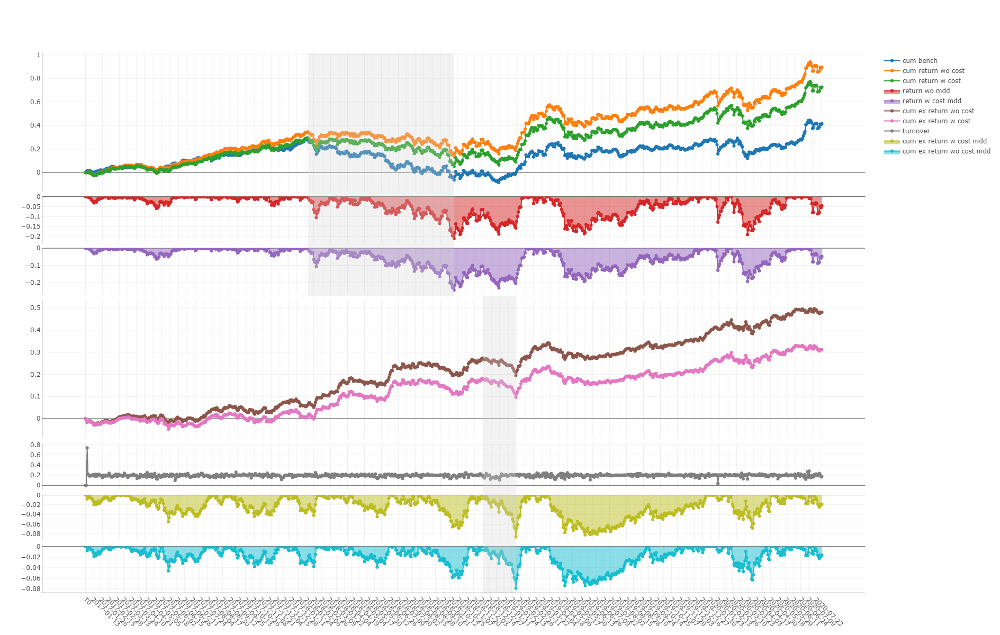

In [7]:
analysis_position.report_graph(report_normal_df)

### risk analysis

E:\Applications\anaconda3\lib\site-packages\qlib\contrib\report\analysis_position\risk_analysis.py:88: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

E:\Applications\anaconda3\lib\site-packages\qlib\contrib\report\analysis_position\risk_analysis.py:88: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

E:\Applications\anaconda3\lib\site-packages\qlib\contrib\report\analysis_position\risk_analysis.py:88: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

E:\Applications\anaconda3\lib\site-packages\qlib\contrib\report\analysis_position\risk_analysis.py:88: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

E:\Applications\anaconda3\lib\site-packages\qlib

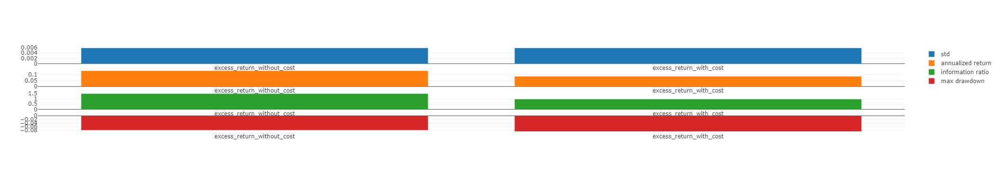

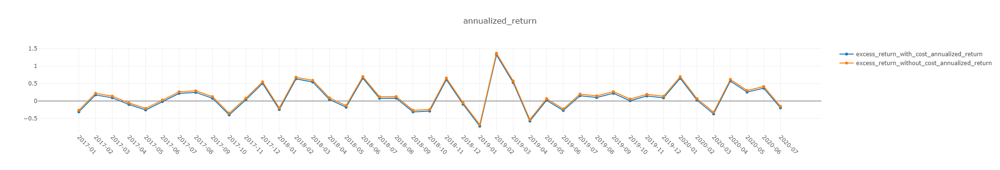

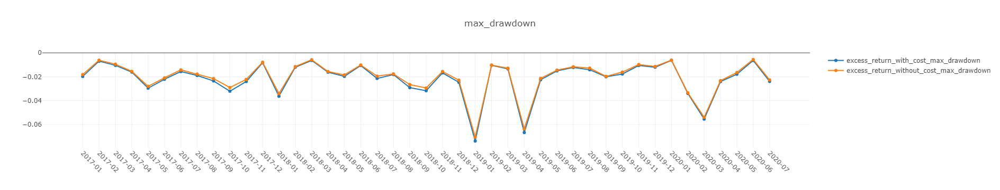

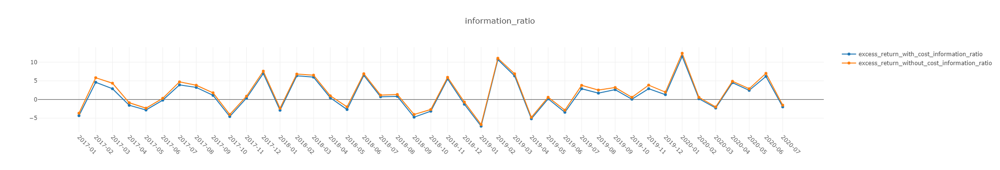

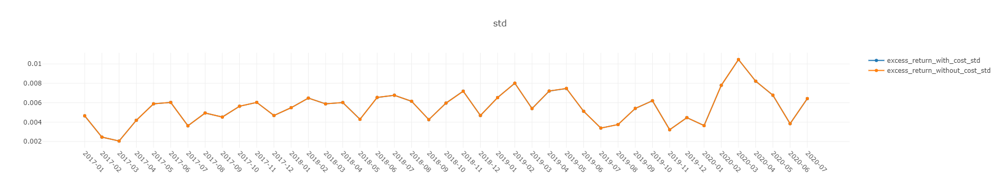

In [8]:
analysis_position.risk_analysis_graph(analysis_df, report_normal_df)

## analysis model

In [10]:
label_df = dataset.prepare("test", col_set="label")
label_df.columns = ['label']

### score IC

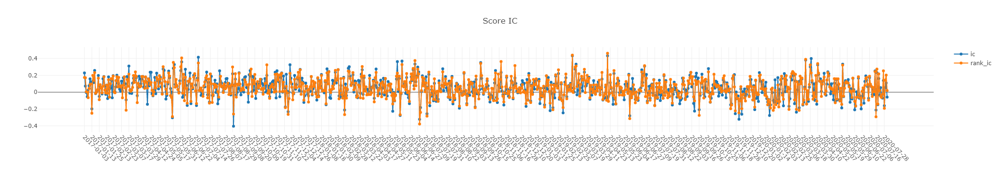

In [11]:
pred_label = pd.concat([label_df, pred_df], axis=1, sort=True).reindex(label_df.index)
analysis_position.score_ic_graph(pred_label)

### model performance

E:\Applications\anaconda3\lib\site-packages\statsmodels\graphics\gofplots.py:993: UserWarning:

marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.



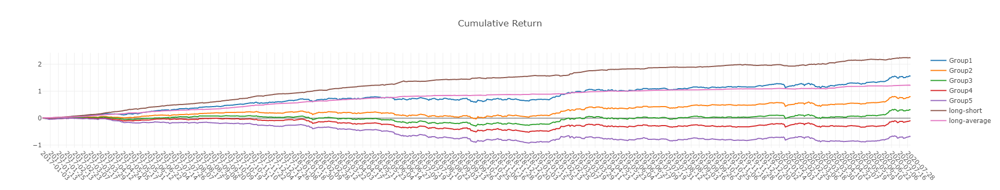

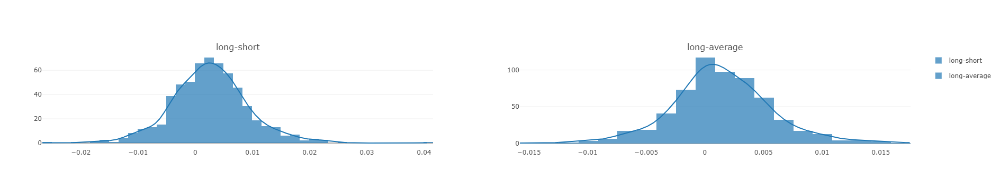

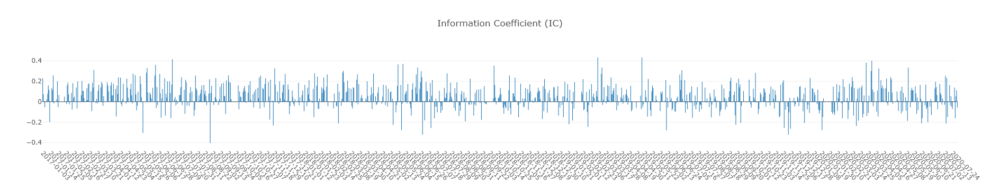

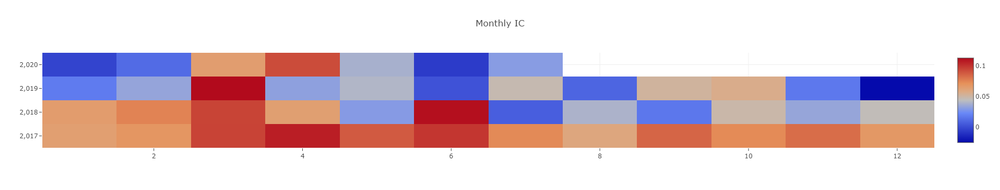

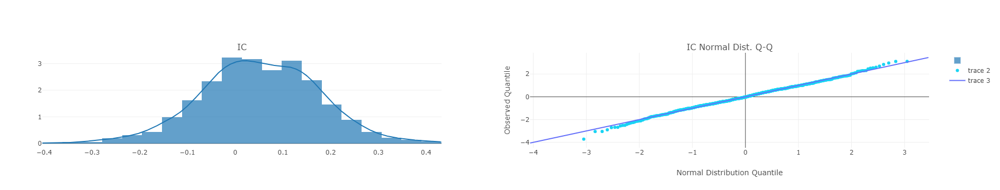

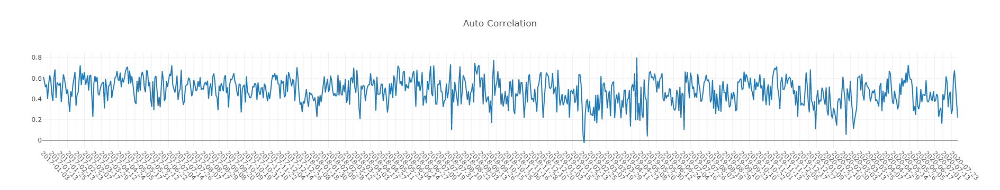

In [12]:
analysis_model.model_performance_graph(pred_label)

In [2]:
from qlib.data import D

In [6]:
instruments = ['SZ002060']
fields = ['$open', '$high', '$low', '$close', '$adjclose', '$volume', '$money', '$factor']
ohlc_data = D.features(instruments, fields, start_time='2020-01-01', end_time='2022-03-26', freq='day')
ohlc_data.tail(100)

$open     $high      $low    $close  $adjclose  \
instrument datetime                                                        
SZ002060   2021-10-29  2.994106  3.083482  2.826525  3.049966       5.46   
           2021-11-01  3.061138  3.156101  3.005278  3.049966       5.46   
           2021-11-02  3.055552  3.077896  2.876800  2.921488       5.23   
           2021-11-03  2.904730  2.927074  2.776251  2.826525       5.06   
           2021-11-04  2.848870  3.016450  2.826525  2.977348       5.33   
...                         ...       ...       ...       ...        ...   
           2022-03-21  3.496848  3.496848  3.496848  3.496848       6.26   
           2022-03-22  3.848767  3.848767  3.848767  3.848767       6.89   
           2022-03-23  4.234202  4.234202  4.234202  4.234202       7.58   
           2022-03-24  4.658740  4.658740  4.658740  4.658740       8.34   
           2022-03-25  5.122379  5.122379  5.027417  5.122379       9.17   

                           $volume  $money   $factor  
instrument datetime                                   
SZ002060   2021-10-29  125978352.0     NaN  0.558602  
           2021-11-01  111932120.0     NaN  0.558602  
           2021-11-02   99008216.0     NaN  0.558602  
           2021-11-03  116350552.0     NaN  0.558602  
           2021-11-04  123209560.0     NaN  0.558602  
...                            ...     ...       ...  
           2022-03-21   16535879.0     NaN  0.558602  
           2022-03-22    9534553.0     NaN  0.558602  
           2022-03-23    8895316.0     NaN  0.558602  
           2022-03-24   10657440.0     NaN  0.558602  
           2022-03-25  463926656.0     NaN  0.558602  

[100 rows x 8 columns]

In [15]:
df = ohlc_data.loc['SZ002060']

In [22]:
(df["$close"] / df["$adjclose"] - df["$factor"]).abs()

datetime
2020-01-02    0.020823
2020-01-03    0.020823
2020-01-06    0.020823
2020-01-07    0.020823
2020-01-08    0.020823
                ...   
2022-03-21    0.000000
2022-03-22    0.000000
2022-03-23    0.000000
2022-03-24    0.000000
2022-03-25    0.000000
Length: 540, dtype: float32

In [19]:
df["$factor"]

datetime
2020-01-02    0.537779
2020-01-03    0.537779
2020-01-06    0.537779
2020-01-07    0.537779
2020-01-08    0.537779
                ...   
2022-03-21    0.558602
2022-03-22    0.558602
2022-03-23    0.558602
2022-03-24    0.558602
2022-03-25    0.558602
Name: $factor, Length: 540, dtype: float32